In [1]:
import sys
!{sys.executable} -m pip install together matplotlib


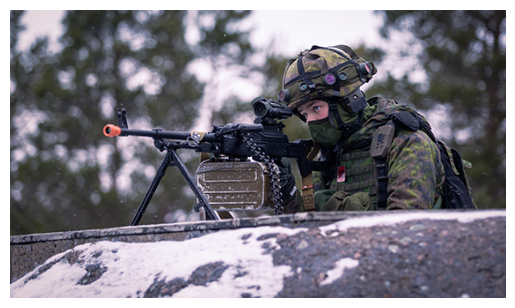

In [3]:
from PIL import Image
import matplotlib.pyplot as plt

def display_local_image(image_path):
    img = Image.open(image_path)
    plt.imshow(img)
    plt.axis('off')
    plt.show()

display_local_image("/Users/chetankothari/VS Projects/BDA_Master_Thesis_ThreatDetection_Data/Data/Images/Test_Image_Semi_Threat.jpg")

In [4]:
#Install AZURE  
!pip install azure.ai.vision.imageanalysis
!pip install pillow
!pip install azure.storage.blob
!pip install azure.cognitiveservices
!pip install azure.authetication
!pip install azure.core
!pip install azure-cognitiveservices-vision-computervision

ERROR: Could not find a version that satisfies the requirement azure.cognitiveservices (from versions: none)
ERROR: No matching distribution found for azure.cognitiveservices
ERROR: Could not find a version that satisfies the requirement azure.authetication (from versions: none)
ERROR: No matching distribution found for azure.authetication


In [5]:
!pip install azure-cognitiveservices-vision-computervision
!pip show azure-cognitiveservices-vision-computervision


Name: azure-cognitiveservices-vision-computervision
Version: 0.9.1
Summary: Microsoft Azure Cognitive Services Computer Vision Client Library for Python
Home-page: https://github.com/Azure/azure-sdk-for-python
Author: Microsoft Corporation
Author-email: azpysdkhelp@microsoft.com
License: MIT License
Location: /opt/anaconda3/lib/python3.11/site-packages
Requires: azure-common, msrest
Required-by: 


In [6]:
!pip install msrest


In [7]:
import requests
import json

# Azure endpoint and API key1
AZURE_ENDPOINT1 = "https://ai-chetankothfin3186ai034440307201.services.ai.azure.com"
AZURE_API_KEY1 = "EHmLoRmjZ6TDjYB4Q2lFQc6CofuN7qVmVqMCgv53mYA0c4nhXpUrJQQJ99BAACHYHv6XJ3w3AAAAACOGqr59"  # Replace with your Azure API key
API_VERSION1 = "2024-05-01-preview"
MODEL_NAME1 = "Llama-3.2-11B-Vision-Instruct"  # Replace with your deployed model name
# Azure endpoint and API key2
AZURE_ENDPOINT2 = "https://kotha-m6mo3oik-francecentral.services.ai.azure.com"
AZURE_API_KEY2 = "Au57Q2Dg9Nh2RAJMlPcDjJrkhXDpdovYqI64YDMu4CAfVwD7xbIQJQQJ99BBAC5T7U2XJ3w3AAAAACOGibeu"  # Replace with your Azure API key
API_VERSION2 = "2024-05-01-preview"
MODEL_NAME2 = "DeepSeek-R1"  # Replace with your deployed model name


In [8]:
#Define Lllama 3.2 and DeepSeek API
def llama32(messages, model_size=11):
  """
    Calls the Llama 3.2 model deployed on Azure for processing messages.
  """
  url = f"{AZURE_ENDPOINT1}/models/chat/completions?api-version={API_VERSION1}"
    
  model = f"{MODEL_NAME1}"
  
  payload = {
    "model": model,
    "max_tokens": 4096,
    "temperature": 0.2,
    "stop": ["<|eot_id|>","<|eom_id|>"],
    "messages": messages
  }
  headers = {
        "Accept": "application/json",
        "Content-Type": "application/json",
        "api-key": AZURE_API_KEY1
  }
  
  res = json.loads(requests.request("POST", url, headers=headers, data=json.dumps(payload)).content)

  if 'error' in res:
    raise Exception(res['error'])

  return res['choices'][0]['message']['content']

def DeepSeek(messages, model_size=11):
  """
    Calls the DeepSeek model deployed on Azure for processing messages.
  """
  url = f"{AZURE_ENDPOINT2}/models/chat/completions?api-version={API_VERSION2}"
    
  model = f"{MODEL_NAME2}"
  
  payload = {
    "model": model,
    "max_tokens": 4096,
    "temperature": 0.2,
    "stop": ["<|eot_id|>","<|eom_id|>"],
    "messages": messages
  }
  headers = {
        "Accept": "application/json",
        "Content-Type": "application/json",
        "api-key": AZURE_API_KEY2
  }
  
  res = json.loads(requests.request("POST", url, headers=headers, data=json.dumps(payload)).content)

  if 'error' in res:
    raise Exception(res['error'])

  return res['choices'][0]['message']['content']


In [11]:
import base64

def encode_image(image_path):
  with open(image_path, "rb") as img:
    return base64.b64encode(img.read()).decode('utf-8')

base64_image = encode_image("/Users/chetankothari/VS Projects/BDA_Master_Thesis_ThreatDetection_Data/Data/Images/Test_Image_Semi_Threat.jpg")


messages = [
  {
    "role": "user",
    "content": [
      {
        "type": "text",
        "text": "Describe the military context of this image in detail. "
        "Identify any military objects, personnel, or settings. "
        "Is there any indication like orange barrels or blank suppressons to weapons? Or Simulation sensors on equipments or clothing that indicates military training or drill ?"

      },
      {
        "type": "image_url",
        "image_url": {
          "url": f"data:image/jpeg;base64,{base64_image}"
        }
      }
    ]
  },
]
    

In [12]:
!pip install azure-storage-file-share
   

In [81]:
# Install the azure-storage-file-share package
%pip install azure-storage-file-share

from azure.storage.fileshare import ShareServiceClient, ShareClient, ShareDirectoryClient, ShareFileClient
   

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 286.4/286.4 kB 3.3 MB/s eta 0:00:00a 0:00:01

[notice] A new release of pip available: 22.3.1 -> 24.3.1
[notice] To update, run: pip3.11 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [6]:


import ollama

def local_llama32(image_data):
    res = ollama.chat(
        model='llama3.2-vision',
        messages=[
            {
                'role': 'user',
                'content': "Describe the military context of this image in detail. "
                "Identify any military objects, personnel, or settings. "
                "Is there any indication like orange barrels or blank suppressors to weapons? Or Simulation sensors on equipments or clothing that indicates military training or drill ?",
                'images': [image_data]
            }
        ]
    )
    return res.message.content

response = local_llama32(base64_image)

print(response)

This image depicts a serene rural landscape featuring a dirt road flanked by trees and grassy fields. A lone motorcyclist is seen riding away from the camera, leaving a trail of dust in their wake.

In the background, a telephone pole rises above the treetops, while a partially obscured forest stretches across the horizon. The blue sky above is dotted with white clouds, adding to the tranquil ambiance of the scene.


In [6]:
image_data = encode_image("/Users/chetankothari/BDA_Master_Thesis_ThreatDetection_Data/Data/Images/Test_Image_Semi_Threat.jpg")
def detect_objects_llama32(image_data):
    res = ollama.chat(
        model="llama3.2-vision",
        messages=[
            {
                "role": "user",
                "content": "Analyze the image and provide a list of all detected objects in a structured format."
                           "\nRespond with only the objects, each on a new line. Also check for orange barrels, blank suppressors, or simulation sensors on equipment or clothing that indicate military training or drills."
                           "\nFor example:\nObjects Detected:\n- Rifle\n- Helmet\n- Military truck\n- Camouflage uniform",
                "images": [image_data],
            }
        ],
    )
    return res["message"]["content"]
print(detect_objects_llama32(image_data))

Objects Detected:

- Machine gun
- Helmet
- Camouflage jacket
- Backpack
- Orange barrel (on the machine gun) 
- Blank suppressor (on the machine gun)
- Simulation sensor (on the helmet)


In [9]:
import os
import base64

# Function to encode image to base64
def encode_image(image_path):
    with open(image_path, "rb") as img:
        return base64.b64encode(img.read()).decode('utf-8')

# Directory containing images
image_directory = "/Users/chetankothari/BDA_Master_Thesis_ThreatDetection_Data/Data/Images"
description_directory = "/Users/chetankothari/BDA_Master_Thesis_ThreatDetection_Data/Data/Descriptions"

# Loop through each image in the directory
for image_name in os.listdir(image_directory):
    image_path = os.path.join(image_directory, image_name)
    description_path = os.path.join(description_directory, f"{os.path.splitext(image_name)[0]}_description.txt")
    threat_class_path= os.path.join(description_directory, f"{os.path.splitext(image_name)[0]}_threat_class.txt")
    
    # Check if the image is already described
    if os.path.exists(description_path):
        print(f"Image {image_name} is already described. Skipping...")
        continue
    
    # Encode image to base64
    try:
        base64_image = encode_image(image_path)
    except Exception as e:
        print(f"Error encoding image {image_name}: {e}")
        continue
    
    # Get description from local_llama32
    try:
        response = local_llama32(base64_image)
    except Exception as e:
        print(f"Error getting description for image {image_name}: {e}")
        continue

    try:
        with open(description_path, "w") as file:
            file.write(f"Description:\n{response}\n\n")
    except Exception as e:
        print(f"Error saving response for image {image_name}: {e}")
    
    # Create new messages for DeepSeek
    new_messages = [
        {
            "role": "user",
            "content": [
                {
                    "type": "text",
                    "text": response + " Based on this text can determine the military threat level on following scale"
                    "0: No military significance, civilian setting. "
                    "1: Low significance, military equipment in a civilian context. "
                    "2: Medium significance, military exercises, battlefield-like setup, or training with blank adaptors. "
                    "3: Increased significance, aggressive tone, battlefield setting, military preparation. "
                    "4: High threat, clear military aggression, attack formations, casualties."
                    "Also make sure the response is limited to resoning and actual threat classification, limiting to 50 characters."
                }
            ]
        }
    ]
    
    # Get threat level from DeepSeek
    try:
        deepseek_response = DeepSeek(new_messages)
    except Exception as e:
        deepseek_response = f"Error: {e}"
    
    # Save responses to a file named after the image
    try:
        with open(threat_class_path, "w") as file:
            file.write(f"DeepSeek Response:\n{deepseek_response}\n")
    except Exception as e:
        print(f"Error saving response for image {image_name}: {e}")

Image coba_train (1718).jpg is already described. Skipping...
Image coba_train (4776).jpg is already described. Skipping...
Image coba_train (822).jpg is already described. Skipping...
Image coba_train (3267).jpg is already described. Skipping...
Image coba_train (463).jpg is already described. Skipping...
Image coba_train_bg (47).jpg is already described. Skipping...
Image coba_train (176).jpg is already described. Skipping...
Image coba_train (3158).jpg is already described. Skipping...


KeyboardInterrupt: 

In [8]:
import os
import base64
import re
import ollama

# Function to encode image to base64
def encode_image(image_path):
    with open(image_path, "rb") as img:
        return base64.b64encode(img.read()).decode("utf-8")

# Function to call Llama3.2-Vision locally
def local_llama32(image_data):
    res = ollama.chat(
        model="llama3.2-vision",
        messages=[
            {
                "role": "user",
                "content": "Describe the military context of this image in detail. "
                "Identify any military objects, personnel, or settings. "
                "List all identifiable objects in the image in a structured format under an 'Objects Detected' section.",
                "images": [image_data],
            }
        ],
    )
    return res["message"]["content"]



# Function to call DeepSeek
def local_deepseek(new_messages, model="deepseek-r1:1.5b"):
    res = ollama.chat(
        model=model,
        messages=new_messages,
    )
    return res["message"]["content"]

# Function to extract reasoning and classification
def extract_think_and_classification(response):
    """
    Extracts reasoning inside <think>...</think> and the final classification number (0-4).
    """
    # Extract reasoning inside <think>...</think>
    think_match = re.search(r"<think>(.*?)</think>", response, re.DOTALL)
    reasoning = think_match.group(1).strip() if think_match else "No reasoning provided"

    # Extract classification (last number between 0-4)
    class_match = re.findall(r'\b[0-4]\b', response)
    classification = class_match[-1] if class_match else "Error: No valid classification found"

    return reasoning, classification

# Function to detect object list
def detect_objects_llama32(image_data):
    res = ollama.chat(
        model="llama3.2-vision",
        messages=[
            {
                "role": "user",
                "content": "Analyze the image and provide a list of all detected objects in a structured format."
                           "\nRespond with only the objects. Also check for orange barrels, blank suppressors, or simulation sensors on equipment or clothing that indicate military training or drills."
                           "\nFor example:\nObjects Detected:\n- Rifle\n- Helmet\n- Military truck\n- Camouflage uniform",
                "images": [image_data],
            }
        ],
    )
    return res["message"]["content"]


# Directories
image_directory = "/Users/chetankothari/BDA_Master_Thesis_ThreatDetection_Data/Data/Images"
description_directory = "/Users/chetankothari/BDA_Master_Thesis_ThreatDetection_Data/Data/Descriptions"
reasoning_directory = "/Users/chetankothari/BDA_Master_Thesis_ThreatDetection_Data/Data/Reasoning"
threat_class_directory = "/Users/chetankothari/BDA_Master_Thesis_ThreatDetection_Data/Data/Threat_Class"
objects_directory = "/Users/chetankothari/BDA_Master_Thesis_ThreatDetection_Data/Data/Objects"

# Ensure directories exist
for directory in [description_directory, reasoning_directory, threat_class_directory, objects_directory]:
    os.makedirs(directory, exist_ok=True)

# Loop through each image in the directory
for image_name in os.listdir(image_directory):
    image_path = os.path.join(image_directory, image_name)
    base_name = os.path.splitext(image_name)[0]

    description_path = os.path.join(description_directory, f"{base_name}_description.txt")
    threat_class_path = os.path.join(threat_class_directory, f"{base_name}_threat_class.txt")
    threat_reasoning_path = os.path.join(reasoning_directory, f"{base_name}_threat_reasoning.txt")
    objects_path = os.path.join(objects_directory, f"{base_name}_objects.txt")

    # Skip already processed images
    if os.path.exists(description_path):
        print(f"Image {image_name} is already described. Skipping...")
        continue

    # Encode image to base64
    try:
        base64_image = encode_image(image_path)
    except Exception as e:
        print(f"Error encoding image {image_name}: {e}")
        continue

    # Get description from Llama 3.2 Vision
    try:
        response = local_llama32(base64_image)
    except Exception as e:
        print(f"Error getting description for image {image_name}: {e}")
        continue

    # Save description
    try:
        with open(description_path, "w") as file:
            file.write(f"Description:\n{response}\n\n")
    except Exception as e:
        print(f"Error saving response for image {image_name}: {e}")

    # Extract objects from response
    objects_detected = detect_objects_llama32(base64_image)

    # Save objects list
    try:
        with open(objects_path, "w") as file:
            file.write("Objects Detected:\n")
            file.write("\n".join(objects_detected))
        print(f"Saved objects: {objects_path}")
    except Exception as e:
        print(f"Error saving objects for {image_name}: {e}")

    # Construct DeepSeek Prompt
    new_messages = [
        {
            "role": "user",
            "content": response
            + "\nBased on this text, determine the military threat level on the following scale:"
            "\n0: No military significance, civilian setting."
            "\n1: Low significance, military equipment in a civilian context."
            "\n2: Medium significance, military exercises, battlefield-like setup, or training with blank adaptors."
            "\n3: Increased significance, aggressive tone, battlefield setting, military preparation."
            "\n4: High threat, clear military aggression, attack formations, casualties."
            "\nAlso, make sure the response is limited to reasoning and actual threat classification, keeping it under 10 characters."
            "\nRespond with a <think>...</think> block for reasoning, followed by a single integer (0, 1, 2, 3, or 4) as the final classification."
        }
    ]

    # Get threat classification from DeepSeek
    try:
        deepseek_response = local_deepseek(new_messages)
    except Exception as e:
        deepseek_response = f"Error: {e}"

    # Extract reasoning and classification
    reasoning, classification = extract_think_and_classification(deepseek_response)

    # Save reasoning
    try:
        with open(threat_reasoning_path, "w") as file:
            file.write(f"Reasoning:\n{reasoning}\n")
        print(f"Saved reasoning: {threat_reasoning_path}")
    except Exception as e:
        print(f"Error saving reasoning for {image_name}: {e}")

    # Save classification
    try:
        with open(threat_class_path, "w") as file:
            file.write(f"Threat Level: {classification}\n")
        print(f"Saved classification: {threat_class_path}")
    except Exception as e:
        print(f"Error saving classification for {image_name}: {e}")


Image coba_train (1718).jpg is already described. Skipping...
Saved objects: /Users/chetankothari/BDA_Master_Thesis_ThreatDetection_Data/Data/Objects/coba_train (4776)_objects.txt
Saved reasoning: /Users/chetankothari/BDA_Master_Thesis_ThreatDetection_Data/Data/Reasoning/coba_train (4776)_threat_reasoning.txt
Saved classification: /Users/chetankothari/BDA_Master_Thesis_ThreatDetection_Data/Data/Threat_Class/coba_train (4776)_threat_class.txt


KeyboardInterrupt: 

In [50]:
import os
import base64
import re
import ollama

# Function to encode image to base64
def encode_image(image_path):
    with open(image_path, "rb") as img:
        return base64.b64encode(img.read()).decode("utf-8")

# Function to call Llama3.2-Vision locally with deterministic settings
def local_llama32(prompt, image_data):
    res = ollama.chat(
        model="llama3.2-vision:11b",
        messages=[
            {
                "role": "user",
                "content": prompt,
                "images": [image_data],
            }
        ],
        options={
            "temperature": 0,  # Ensures consistent outputs
            "top_k": 1,
            "top_p": 1
        }
    )
    return res["message"]["content"].strip()

# Function to call DeepSeek
def local_deepseek(new_messages, model="deepseek-r1:8b"):
    res = ollama.chat(
        model=model,
        messages=new_messages,
        options={
            "temperature": 0,
            "top_k": 1,
            "top_p": 1
        }
    )
    return res["message"]["content"].strip()

# Function to extract reasoning and classification
def extract_think_and_classification(response):
    """
    Extracts reasoning inside <think>...</think> and the final classification number (0-4).
    """
    # Extract reasoning inside <think>...</think>
    think_match = re.search(r"<think>(.*?)</think>", response, re.DOTALL)
    reasoning = think_match.group(1).strip() if think_match else "No reasoning provided"

    # Extract classification (last number between 0-4)
    class_match = re.findall(r'\b[0-4]\b', response)
    classification = class_match[-1] if class_match else "Error: No valid classification found"

    return reasoning, classification

# Function to detect object list with deterministic settings
def detect_objects_llama32(image_data):
    res = ollama.chat(
        model="llama3.2-vision:11b",
        messages=[
            {
                "role": "user",
                "content": "Analyze the image and provide a structured list of all detected objects."
                           "\nInclude: Weapons, military uniforms, vehicles, and training indicators."
                           "\nExample:\nObjects Detected:\n- Rifle\n- Helmet\n- Military truck\n- Camouflage uniform",
                "images": [image_data],
            }
        ],
        options={
            "temperature": 0,
            "top_k": 1,
            "top_p": 1
        }
    )
    return res["message"]["content"].strip()

# Directories
base_dir = "/Users/chetankothari/VS Projects/BDA_Master_Thesis_ThreatDetection_Data"
image_directory = os.path.join(base_dir, "Data/Images")
description_directory = os.path.join(base_dir, "Data/Descriptions")
reasoning_directory = os.path.join(base_dir, "Data/Reasoning")
threat_class_directory = os.path.join(base_dir, "Data/Threat_Class")
objects_directory = os.path.join(base_dir, "Data/Objects")
prompt_directory = os.path.join(base_dir, "Prompts")

prompt_context = os.path.join(prompt_directory, "Military_context.txt")
prompt_equipment = os.path.join(prompt_directory, "Equipment_Profiling.txt")
prompt_agression = os.path.join(prompt_directory, "Agression_Clarification.txt")


In [46]:
#image1= encode_image("/Users/chetankothari/VS Projects/BDA_Master_Thesis_ThreatDetection_Data/Data/Images/Test_Image_Semi_Threat.jpg")

prompt1 = open(prompt_context, "r").read()   
prompt2 = open(prompt_equipment, "r").read()
prompt3 = open(prompt_agression, "r").read()
#response1 = local_llama32(prompt1,image1)
#response2 = local_llama32(prompt2,image1)
#response3 = local_llama32(prompt3,image1)
#print(response1)
#print(response2)
#print(response3)


In [57]:

# Ensure directories exist
for directory in [description_directory, reasoning_directory, threat_class_directory, objects_directory]:
    os.makedirs(directory, exist_ok=True)

# Loop through each image in the directory
for image_name in os.listdir(image_directory):
    image_path = os.path.join(image_directory, image_name)
    base_name = os.path.splitext(image_name)[0]

    description_path = os.path.join(description_directory, f"{base_name}_description.txt")
    threat_class_path = os.path.join(threat_class_directory, f"{base_name}_threat_class.txt")
    threat_reasoning_path = os.path.join(reasoning_directory, f"{base_name}_threat_reasoning.txt")
    objects_path = os.path.join(objects_directory, f"{base_name}_objects.txt")

    # Skip already processed images
    if os.path.exists(description_path):
        print(f"Image {image_name} is already described. Skipping...")
        continue

    # Encode image to base64
    try:
        base64_image = encode_image(image_path)
    except Exception as e:
        print(f"Error encoding image {image_name}: {e}")
        continue

    # Get description from Llama 3.2 Vision
    try:
        response1 = local_llama32(prompt1,base64_image)
        response2 = local_llama32(prompt2,base64_image)
        response3 = local_llama32(prompt3,base64_image)   
    except Exception as e:
        print(f"Error getting description for image {image_name}: {e}")
        continue

    # Save description
    try:
        with open(description_path, "w") as file:
            file.write(f"Description:\n{response1 + response2 + response3}\n\n")
    except Exception as e:
        print(f"Error saving response for image {image_name}: {e}")

    # Extract objects from response
    objects_detected = detect_objects_llama32(base64_image)

    # Save objects list correctly formatted
    try:
        with open(objects_path, "w") as file:
            file.write(f"Objects Detected:\n{objects_detected}\n")
        print(f"Saved objects: {objects_path}")
    except Exception as e:
        print(f"Error saving objects for {image_name}: {e}")

    # Construct DeepSeek Prompt
    new_messages = [
        {
            "role": "user",
            "content": response1 + "\n" + response2 + "\n" + response3  
            + "\nBased on this text, determine the military threat level on the following scale:"
            "\n0: No military significance, civilian setting."
            "\n1: Low significance, military equipment in a civilian setting,public display, non combat formations."
            "\n2: Medium significance, military exercises, battlefield-like setup, or training, weapons with blank adaptors or orange/red/yellow tip or tale tale signs of training."
            "\n3: Increased significance, aggressive tone, battlefield setting, military preparation."
            "\n4: High threat, clear military aggression, attack formations, casualties."
            "\nAlso, make sure the response is limited to reasoning and actual threat classification, keeping it under 10 characters."
            "\nRespond with a <think>...</think> block for reasoning, followed by a single integer (0, 1, 2, 3, or 4) as the final classification."
        }
    ]

    # Get threat classification from DeepSeek
    try:
        deepseek_response = local_deepseek(new_messages)
    except Exception as e:
        deepseek_response = f"Error: {e}"

    # Extract reasoning and classification
    reasoning, classification = extract_think_and_classification(deepseek_response)

    # Save reasoning
    try:
        with open(threat_reasoning_path, "w") as file:
            file.write(f"Reasoning:\n{reasoning}\n")
        print(f"Saved reasoning: {threat_reasoning_path}")
    except Exception as e:
        print(f"Error saving reasoning for {image_name}: {e}")

    # Save classification
    try:
        with open(threat_class_path, "w") as file:
            file.write(f"Threat Level: {classification}\n")
        print(f"Saved classification: {threat_class_path}")
    except Exception as e:
        print(f"Error saving classification for {image_name}: {e}")


Saved objects: /Users/chetankothari/VS Projects/BDA_Master_Thesis_ThreatDetection_Data/Data/Objects/coba_train (3267)_objects.txt
Saved reasoning: /Users/chetankothari/VS Projects/BDA_Master_Thesis_ThreatDetection_Data/Data/Reasoning/coba_train (3267)_threat_reasoning.txt
Saved classification: /Users/chetankothari/VS Projects/BDA_Master_Thesis_ThreatDetection_Data/Data/Threat_Class/coba_train (3267)_threat_class.txt
Saved objects: /Users/chetankothari/VS Projects/BDA_Master_Thesis_ThreatDetection_Data/Data/Objects/coba_train_bg (47)_objects.txt
Saved reasoning: /Users/chetankothari/VS Projects/BDA_Master_Thesis_ThreatDetection_Data/Data/Reasoning/coba_train_bg (47)_threat_reasoning.txt
Saved classification: /Users/chetankothari/VS Projects/BDA_Master_Thesis_ThreatDetection_Data/Data/Threat_Class/coba_train_bg (47)_threat_class.txt
Error getting description for image .DS_Store: failed to decode image: image: unknown format (status code: 500)


In [58]:
for threat_file in os.listdir(threat_class_directory):
    with open(os.path.join(threat_class_directory, threat_file), "r") as file:
        
        print(file.read())



Threat Level: 0

Threat Level: 0

Threat Level: 0

Threat Level: 1

Threat Level: 0

Threat Level: 0

Threat Level: 1

Threat Level: 0

Threat Level: 0

Threat Level: 0

Threat Level: 3

Threat Level: 2

Threat Level: 0

Threat Level: 4

Threat Level: 0

Threat Level: 1

Threat Level: 1

Threat Level: 0

Threat Level: 0

Threat Level: 0

Threat Level: 1

Threat Level: 4

Threat Level: 0

Threat Level: 2

Threat Level: 0

Threat Level: 0

Threat Level: 4

Threat Level: 1

Threat Level: 3

Threat Level: 0

Threat Level: 0

Threat Level: 1

Threat Level: 2

Threat Level: 0

Threat Level: 2

Threat Level: 0

Threat Level: 0

Threat Level: 0

Threat Level: 0

Threat Level: 2

Threat Level: 3

Threat Level: 0

Threat Level: 2

Threat Level: 2

Threat Level: 2

Threat Level: 0

Threat Level: 0

Threat Level: 1

Threat Level: 0

Threat Level: 2

Threat Level: 0

Threat Level: 0

Threat Level: 0

Threat Level: 3

Threat Level: 1

Threat Level: 0

Threat Level: 0

Threat Level: 0

Threat Level: 

objects: b'Objects Detected:\nThe image depicts a serene outdoor setting, featuring a small pond or fountain surrounded by lush greenery. The focal point of the scene is the two wooden barrels situated atop a stone wall, which appear to be serving as water features.\n\nHere are the objects detected in the image:\n\n*   **Wooden Barrels:**\n    *   Two wooden barrels with metal bands around their middle\n    *   Positioned on top of a stone wall\n    *   Water flowing from the top of each barrel into the pond below\n*   **Stone Wall:**\n    *   A short, rectangular stone wall supporting the wooden barrels\n    *   Made up of large, rough-hewn stones stacked horizontally\n*   **Pond or Fountain:**\n    *   A small body of water surrounded by greenery\n    *   Water flowing from the wooden barrels into the pond\n*   **Greenery:**\n    *   Various plants and trees surrounding the pond and stone wall\n    *   Some plants have red leaves, while others are a vibrant green\n\nIn summary, the i

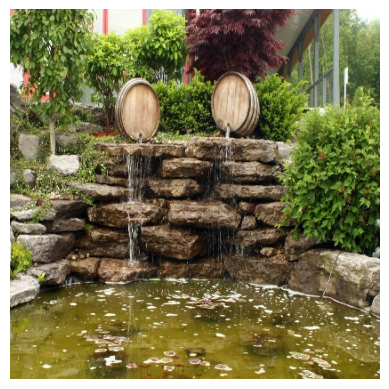



Threat Classification: Threat Level: 1



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on the given image analysis. The scene is described as serene with a pond and waterfall, no uniforms or gear visible. No weapons or aggressive postures are mentioned. It seems like it's a controlled training exercise but without any specific indicators of high threat.

First, I'll consider the scale provided: 0 to 4. 

- **0**: No military significance, civilian setting.
- **1**: Low significance, military equipment in a civilian setting, public display, non-combat formations.
- **2**: Medium significance, military exercises with battlefield-like setups or training, weapons with blank adaptors or orange/red/yellow tips.
- **3**: Increased significance, aggressive tone, battlefield settings, military preparation.
- **4**: High threat, clear military aggression, attack formations, casualties.

The image doesn't show any signs of conflict. It's a peaceful setting

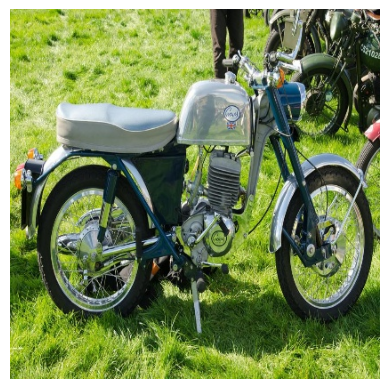



Threat Classification: Threat Level: 1



Reasoning: Reasoning:
Okay, so I'm trying to figure out the military threat level based on this scenario assessment. Let me go through each part step by step.

First, the scene is described as either a training ground or a military base because of the motorcycle and someone in uniform. The person's gear includes dark pants and jacket with insignia, which suggests they're part of some military group but not necessarily in combat. The motorcycle is civilian, so maybe it's for transportation rather than combat use.

The threat level was initially considered moderate at 3/5 because it's a training ground or base, which can be sensitive areas. But now I need to assess the equipment profiling and other factors.

Looking at detected equipment: the motorcycle is civilian, no tactical gear visible, and no weapons. So that lowers the combat readiness indicators. No simulation markers either, so it's not like a controlled training exercise with fake wea

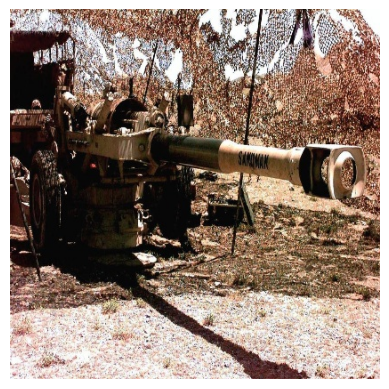



Threat Classification: Threat Level: 3



Reasoning: Reasoning:
Okay, so I'm trying to figure out the military threat level based on this scenario provided. Let me break it down step by step.

First, looking at the scene type: it's a battlefield setting. That already gives me some indication that there might be some combat elements involved. The personnel are wearing camouflage uniforms with visible patches and insignias, which is typical in military operations. They have rifles, helmets, and communication devices, so they're definitely equipped for combat.

The threat level is currently classified as 3, but I need to determine if it's accurate or needs adjustment based on the given information. The detected equipment includes a large wheeled vehicle with a cannon, specifically an M119A2 howitzer. That's a significant piece of artillery, so that adds to the potential threat level.

Now, looking at the simulation vs. real combat indicators: there are no orange-tipped barrels, which us

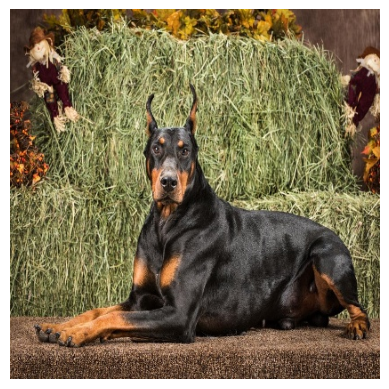



Threat Classification: Threat Level: 2



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on the given information. Let me start by reading through the assessment again.

The scene is described as a Military Base with standard uniforms and no insignia. The personnel have rifles and ammo, which suggests it's a military setting. The threat level is initially assessed as 2 (Moderate). 

Looking at the analysis, there's no visible military equipment beyond the uniforms and weapons. The environment seems controlled, possibly for training or photography. There are hay bales and a backdrop, indicating a setup rather than an active combat situation.

The aggression level is 3 because the dog is engaging directly with the individual, who is defending themselves. However, the context suggests this might be part of a training exercise or non-military scenario since there's no indication of real combat elements like suppressors or simulation gear.

Now, consid

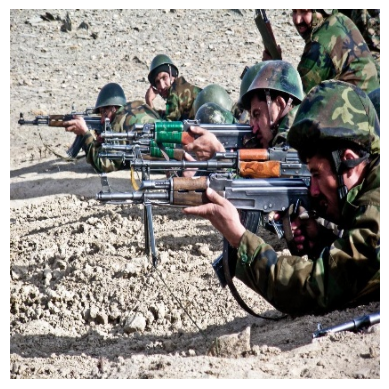



Threat Classification: Threat Level: 4



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on the given scenario. Let me start by reading through all the information provided.

First, the scene type is battlefield. That already gives a hint that it's not a civilian setting. The personnel are wearing camouflage uniforms with green and brown hues. Camouflage usually suggests a tactical or combat environment, which aligns with a battlefield scenario. They have rifles, helmets, and ammunition belts visible, which are definitely equipment used in combat situations.

The threat level is currently assessed at 3, but I need to determine if that's accurate based on the given details. The assessment mentions that without clear insignia or ranks, it's hard to determine specific roles, but the presence of weapons and tactical gear indicates a potential for conflict.

Looking at the equipment profiling, rifles, helmets, and body armor are detected. There's no in

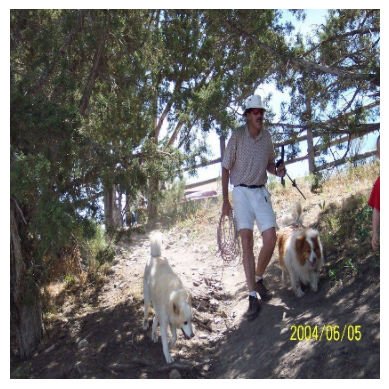



Threat Classification: Threat Level: 1



Reasoning: Reasoning:
Okay, so I'm trying to figure out the military threat level based on this image description. Let me go through each part step by step.

First, the scene is described as a training or patrol scenario but doesn't look like an actual battlefield. The personnel are in casual civilian clothes with no military insignia visible. That makes me think it's not a real deployment but maybe a simulation or exercise.

Looking at the equipment, there's a man walking with two dogs. No weapons or tactical gear are mentioned, which is interesting because that usually indicates some level of preparation. The baseball cap could be seen as tactical for sun protection, but without more specific gear like body armor or firearms with combat features, it's hard to classify this as high threat.

The aggression level is noted as 2 because there's a firearm with an orange tip, which I think is used in training. No signs of combat posture are mentio

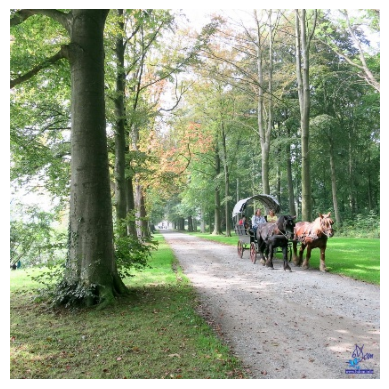



Threat Classification: Threat Level: 1



Reasoning: Reasoning:
Okay, so I'm trying to figure out the military threat level based on this scenario described. Let me break it down step by step.

First, the scene is set in what looks like a training or historical reenactment setting. The personnel are dressed in period-specific attire, which makes me think it's not an active battlefield but maybe something like a historical event or a reenactment of a past battle. That already gives me a hint that the threat level might be low.

Next, looking at the equipment: there's a horse-drawn carriage, which isn't military gear at all. No visible weapons or tactical gear like helmets or body armor. So, no modern military equipment here. This makes me think it's definitely not an active combat zone because they're using old-fashioned transportation and clothing.

The threat level scale goes from 0 to 4. 0 is no military significance, just a civilian setting. 1 is low significance, maybe some milit

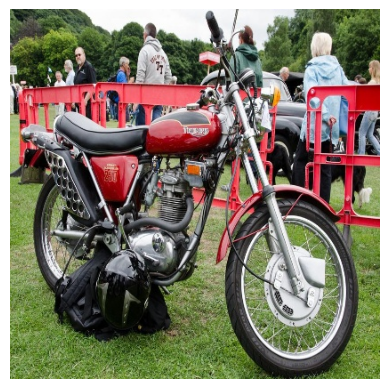



Threat Classification: Threat Level: 1



Reasoning: Reasoning:
Okay, so I'm trying to figure out the military threat level based on this image description. Let me break it down step by step.

First, the scene is described as a motorcycle parked on grass with people standing around it. There's no mention of uniforms or insignia, which makes me think these aren't military personnel. The absence of any indicators like hostility or danger suggests it's not an active combat situation. So that already points towards a lower threat level.

Next, looking at the equipment: the motorcycle has black seats, red bodywork, and silver handlebars. There's also a black bag attached to the front. Without knowing more about these specifics, I can't say for sure if this is military gear or just civilian stuff. The lack of visible simulation indicators means it doesn't look like a training exercise either.

The environmental context mentions grassy terrain and trees in the background. This makes me thin

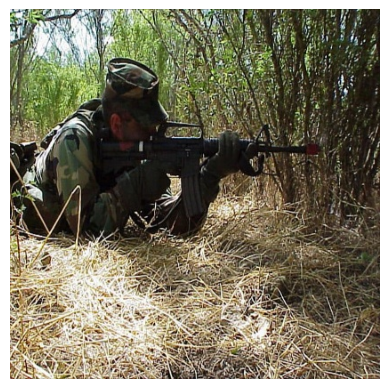



Threat Classification: Threat Level: 4



Reasoning: Reasoning:
Okay, so I'm trying to figure out the military threat level based on the scenario provided. Let me break it down step by step.

First, looking at the personnel: they're wearing camouflage uniforms without any visible ranks or insignia. That makes me think they might be in a combat-ready position, which is a bit concerning. They have rifles and seem to be on high alert, so that suggests an active combat situation could be happening.

The location is a wooded area, possibly a battlefield or training ground. The dry grass and small trees around them make it look like a natural setting, but the fact that they're in a combat-ready position makes me wonder if this is a real deployment or a training exercise.

Their operational status says they're on high alert and prepared for immediate action. That's a key indicator of an active threat because it implies they're ready to engage at a moment's notice. The equipment profiling sh

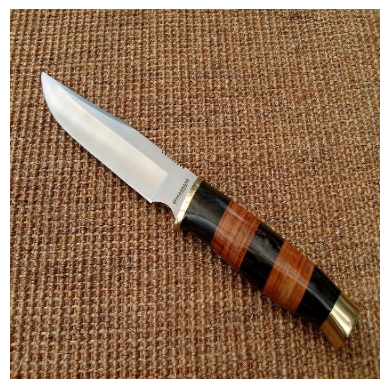



Threat Classification: Threat Level: 2



Reasoning: Reasoning:
Okay, so I'm trying to figure out the military threat level based on this scenario assessment and the equipment profiling prompt. Let me break it down step by step.

First, looking at the scene type: it's a battlefield. That already suggests some level of military activity, but I need to assess how significant the threat is. The personnel gear includes standard combat uniforms with visible rank insignia, which indicates they're in a military setting rather than a civilian one. They have a knife as detected equipment, and no other visible weapons or tactical gear.

The simulation vs. real combat analysis mentions that there are no markers like orange-tipped barrels or suppressors, so it doesn't look like a training exercise with those indicators. However, the presence of just a knife suggests it might be for self-defense rather than combat. The environmental context says the scene isn't indicating a real military deployme

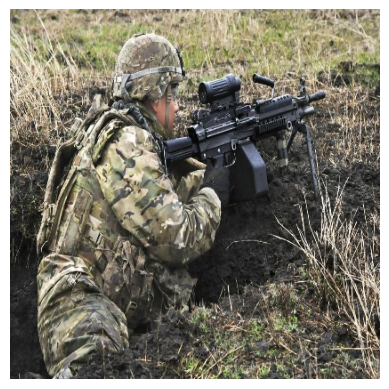



Threat Classification: Threat Level: 4



Reasoning: Reasoning:
Okay, so I'm trying to figure out the military threat level based on this scenario provided. Let me break it down step by step.

First, looking at the personnel: they're wearing camouflage uniforms without any visible ranks or insignia. That makes me think they might be in a combat situation because usually, in training exercises, units have some form of identification. Also, they're equipped with helmets and backpacks, which are standard for soldiers on deployment but not necessarily exclusive to that.

The location is described as a battlefield with grass and dirt, no buildings or infrastructure nearby. That definitely points towards an actual combat zone rather than a controlled training area. If it were a training exercise, I'd expect some kind of base or structured environment, right?

Their operational status says they're on active duty, carrying weapons and protective gear, which aligns with being in a combat-read

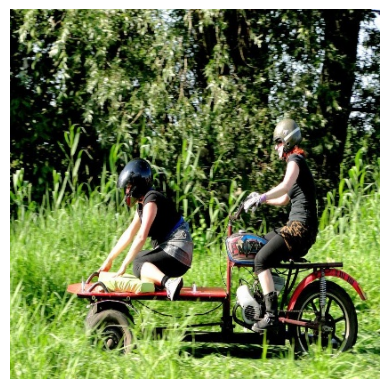



Threat Classification: Threat Level: 1



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on this scenario. Let me start by reading through all the details again.

The scene is set on a training ground. The personnel are wearing casual clothes and helmets, but no military uniforms or insignia. That makes me think it's not an active duty situation because usually, you'd see some sort of uniform in that case.

They're riding a red, three-wheeled vehicle. Hmm, three-wheeled vehicles are often used in military contexts for off-road purposes, like in tactical operations. But since they're wearing casual clothes and there's no visible military gear, it doesn't look like an actual deployment or combat situation.

The threat level is initially assessed as 1 (Low), but then the equipment profiling mentions that the vehicle could be for recreational use. The simulation vs. real combat indicators don't show any signs of active combat, like orange-tipped barre

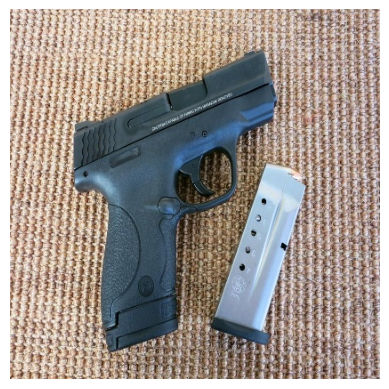



Threat Classification: Threat Level: 3



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on the given scenario. Let me start by reading through all the details carefully.

The scene is described as a battlefield setting with personnel wearing standard combat uniforms and visible rank insignia. They have standard issue weapons and communication devices, which suggests they're in a military context. The presence of advanced weaponry and tactical gear indicates they're prepared for combat operations. The rank insignia points towards high-ranking officers or specialized units, possibly involved in strategic planning or tactical execution.

Looking at the additional observations, it mentions that the scenario is dynamic and potentially volatile, with highly trained personnel equipped for complex military operations. So, this isn't a simple training exercise; they're ready to handle serious combat situations.

Now, the equipment profiling shows a handgu

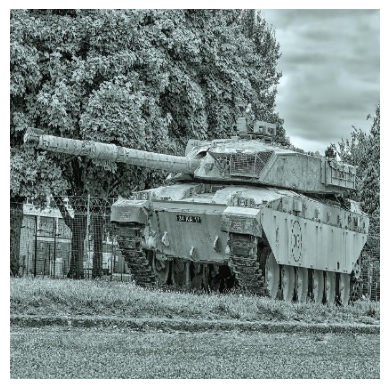



Threat Classification: Threat Level: 1



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on the given scenario and analysis. Let me start by going through each part of the information provided.

First, the scene is described as a military base or training ground with a tank visible. The tank is identified as an M1 Abrams because of its distinctive features like the turret and hull design. It's equipped with a main gun barrel, which is likely the 120mm smoothbore cannon typical for this model.

The image doesn't show any people, so I can't directly assess if there are soldiers present or not. However, if it were part of an exercise or patrol, one might expect soldiers in standard combat uniforms with additional gear like helmets and vests. But since no personnel are visible, that's a point to consider.

Threat level is tricky because there are no clear indicators of hostility or aggression. The tank is stationary, which suggests it's not actively e

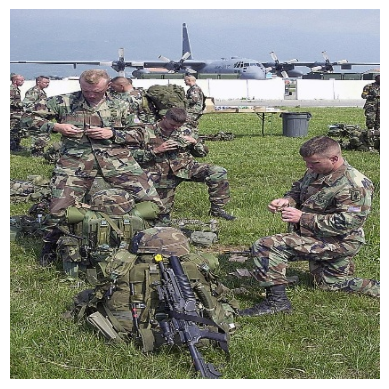



Threat Classification: Threat Level: 2



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on the given scenario. Let me start by reading through all the information provided.

The scene is described as a military base or training ground because there are aircraft in the background and personnel wearing camouflage uniforms. The personnel have no visible insignia or ranks, which might mean they're in a uniform group without individual identifiers, possibly for privacy during training.

Looking at the equipment, there are rifles, machine guns, grenades, body armor, helmets, communication devices like radios, backpacks with tactical gear, first aid kits, water bottles, and rucksacks. These are all standard military gear, so that's a big indicator of a military setting.

The training indicators section says none are visible in the image, which is interesting because if it were a training exercise, maybe there would be more obvious signs like formations 

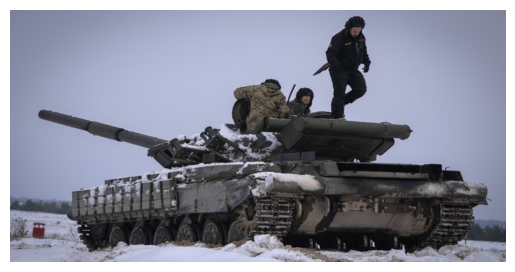



Threat Classification: Threat Level: 2



Reasoning: Reasoning:
Okay, so I'm trying to figure out the military threat level based on this scenario. Let me start by reading through all the information provided.

First, the scene is described as a training ground or military base with a tank and personnel. The uniforms are winter attire, which makes me think they're preparing for cold-weather operations. There's no visible insignia, so maybe it's more about functionality than rank display.

The threat level was initially classified as low-to-medium (2-3). But then there's an equipment profiling section that mentions a T-72 tank and soldiers with tactical gear like helmets and body armor. It also notes the lack of simulation markers, which usually would indicate training exercises. However, soldiers are on top of the tank, which is unusual for training because that's more of a real combat scenario.

In the aggression clarification, it says there's no direct combat posture—no aiming or t

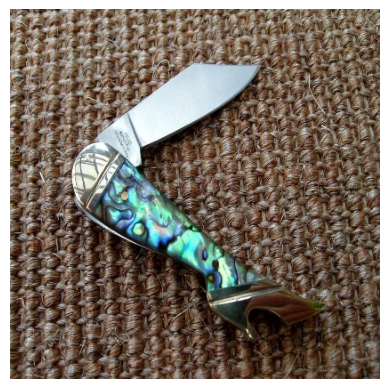



Threat Classification: Threat Level: 2



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on the given scenario and analysis. Let me start by reading through everything carefully.

The scene is set on a training ground. The personnel are wearing standard military fatigues but without any visible insignia or ranks. That makes me think they might be in a non-combat role, maybe like support or logistics. They have standard issue rifles and ammo belts, which suggests it's a military setting, but not necessarily active combat.

There's also a first aid kit attached to one soldier's belt. That indicates they're prepared for medical emergencies, so maybe this is part of a training exercise that includes basic first aid or battlefield preparation.

The threat level is currently assessed as 2. The reasoning behind that is the controlled environment, possibly for demonstration or education. They have equipment typical of military training but not in a combat

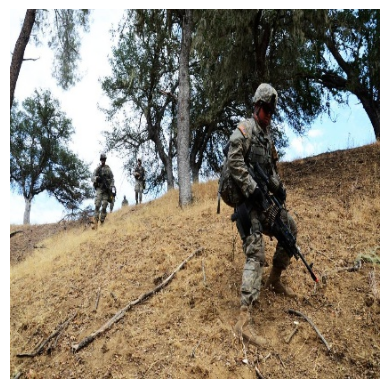



Threat Classification: Threat Level: 3



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on the given scenario. Let me start by reading through all the details carefully.

The scene is described as a battlefield setting with personnel in camouflage fatigues and visible rank insignia. They're equipped with rifles, backpacks, and communication devices. The threat level is initially assessed as 3 out of 5. 

Looking at the equipment profiling, they have rifles, helmets, body armor, backpacks, and communication devices but no clear simulation indicators like orange-tipped barrels. The environmental context suggests a controlled training exercise because there are multiple individuals in uniform, indicating an organized group rather than solo deployment.

In the conclusion, it's noted that this is likely a training exercise with an aggression level of 3. Indicators include direct combat posture, weapons readiness without visible threats, and possibly d

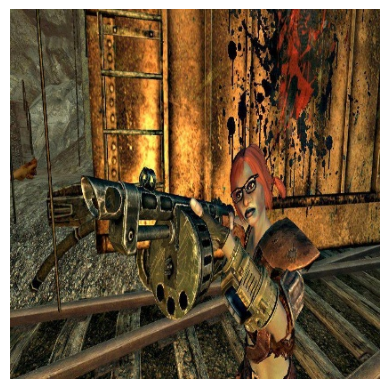



Threat Classification: Threat Level: 2



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on the given scenario. Let me start by reading through all the information provided.

First, the scene type is a battlefield, which immediately suggests it's related to combat or military operations. The personnel gear includes a rifle and combat attire, but no visible insignia. That makes me think it's either a soldier in a real combat situation or someone in a training exercise without rank identifiers.

The threat level is initially assessed as 4, indicating high threat with clear military aggression, attack formations, and possible casualties. But then there's an equipment profiling prompt that says the rifle has an orange tip, which usually indicates it's a training weapon. The environment is natural with trees and foliage, suggesting it's not a controlled training area.

The conclusion from the initial assessment was that it's a real combat scenario beca

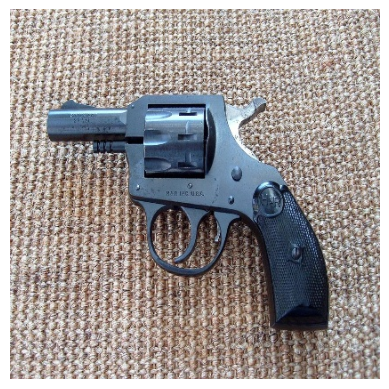



Threat Classification: Threat Level: 2



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on the given scenario assessment and equipment profiling prompt. Let me break this down step by step.

First, looking at the scene type: it's a battlefield setting. That already suggests some level of military preparation or activity. The personnel are wearing standard military attire with camouflage, which is typical for combat situations. They have visible backpacks and utility belts, indicating they're equipped for action. The presence of rank insignia on sleeves and chest shows a structured command hierarchy, which is common in real combat scenarios.

The threat level is initially assessed as 4, but that's before considering the equipment profiling prompt. The detected equipment includes a revolver, which is a type of handgun. Now, the simulation vs. real combat section says there are no indicators of simulation or real combat present. So, it suggests a co

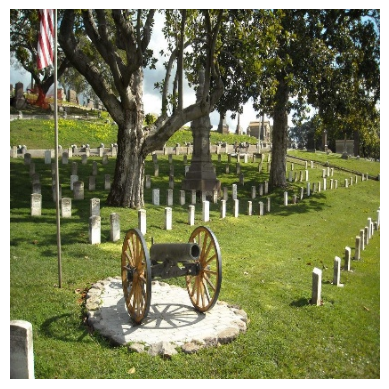



Threat Classification: Threat Level: 2



Reasoning: Reasoning:
Okay, so I'm trying to figure out the military threat level based on this image description. Let me go through each part step by step.

First, the scene is described as a military cemetery or memorial site, possibly from the Civil War era because of the old cannon and the style of headstones. That gives me some historical context. The presence of an American flag suggests it's a place to remember those who served in the military, so it's likely a remembrance site rather than an active combat area.

Personnel-wise, there are no visible people in the image. So I can't see anyone there, but the cannon is present. That makes me think it might be part of a display or a training exercise. The threat level is currently 0 because there's no indication of any immediate threats to the area.

Looking at the equipment profiling, the main thing here is the cannon. It's described as possibly used for training purposes. There are no ot

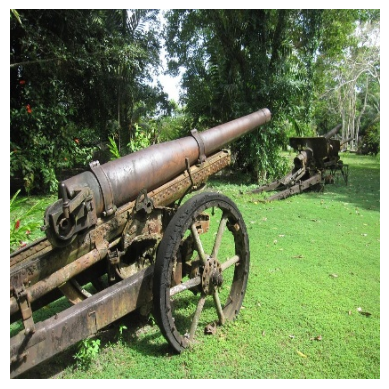



Threat Classification: Threat Level: 1



Reasoning: Reasoning:
Okay, so I'm trying to figure out the military threat level based on this scenario. The image shows a military base or training ground with an old cannon and its carriage in good condition. There are no people visible, but if there were, they'd be in standard issue uniforms with insignia indicating their rank and unit.

First, I need to assess the Threat Level scale provided: 0 is no military significance, like a civilian setting. 1 is low significance, such as military equipment in a civilian setting for public display without any combat formations. 2 indicates medium significance, like military exercises or training with weapons that might have blank adaptors or other signs of being used for practice. 3 means increased significance, like an aggressive tone, battlefield settings, or military preparation. Finally, 4 is high threat, involving clear aggression, attack formations, and potential casualties.

Looking at the s

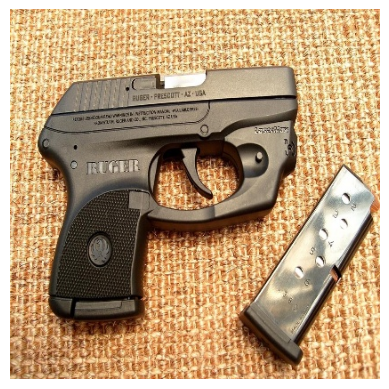



Threat Classification: Threat Level: 2



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on the given scenario assessment. Let me start by reading through all the information provided.

First, the scene type is Battlefield. That already gives a hint that it's related to military operations. The personnel gear includes standard combat uniforms with visible rank insignia and standard issue weapons like the Ruger LCP II .380 ACP Pistol along with its magazine. The presence of a firearm suggests an active combat environment.

The threat level is initially assessed as 3, but I need to determine if that's accurate or if it should be adjusted based on additional factors. The equipment profiling prompt mentions that the detected equipment includes the Ruger LCP II and its magazine. It also notes that there are no simulation markers visible, which might suggest this isn't a training scenario but an actual combat deployment.

The environmental context says 

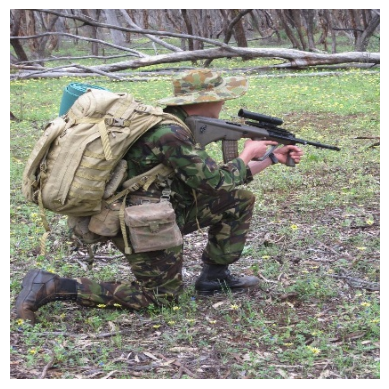



Threat Classification: Threat Level: 3



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on the given information. Let me start by reading through the details again.

The scene is described as a battlefield type. The individual is dressed in a camouflage uniform without any visible rank or insignia, which makes me think it's either a training scenario or someone avoiding identification. They're carrying a rifle with a scope and have a tactical backpack, combat boots. So, definitely equipped for combat.

The threat level is initially assessed as 3/5 because they're in combat operations, but without clear unit info or mission details, it's hard to go higher. The equipment includes a rifle with scope, which suggests active use, not just training. They have a tactical backpack and combat boots, which are typical for soldiers.

The environment is a controlled training exercise because there are no simulation indicators like orange-tipped barrels. So ma

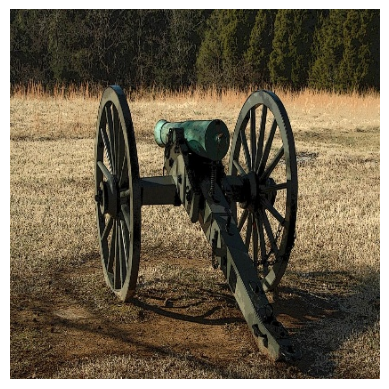



Threat Classification: Threat Level: 1



Reasoning: Reasoning:
Okay, so I'm trying to figure out the military threat level based on this battlefield scenario. Let me break it down step by step.

First, the scene is described as a battlefield with cannons visible. The uniforms aren't visible because of the distance and angle, which makes me think maybe they're not in uniform or perhaps it's from a distance where details are hard to see. The equipment includes cannons, but they mention that these are present more like historical or reenactment gear rather than active military use. So, this isn't an actual combat situation.

The threat level is initially assessed as 0 because it's either a historical setting or a museum. But then there's another part where the simulation vs. real combat is noted as no indicators of simulation or real combat are present. The environmental context suggests it's a controlled training exercise, probably for historical reenactments or educational purposes.


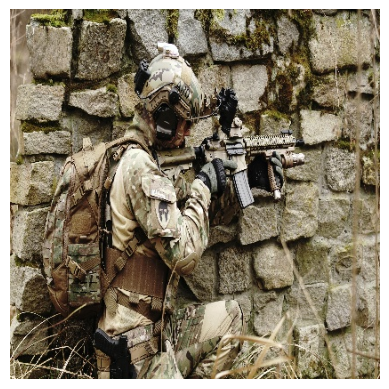



Threat Classification: Threat Level: 3



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on the given scenario. Let me start by reading through all the details carefully.

First, the personnel are dressed in camouflage uniforms with helmets and tactical vests. No rank insignia is visible, which might mean they're in a combat zone where such details aren't necessary or maybe it's a training exercise without markings. The location is described as rocky terrain with some vegetation, not looking like a typical military base or training ground. That makes me think it's more of a battlefield or combat zone setting.

They seem to be on high alert and in a defensive posture, positioned against a wall. This suggests they're ready for action, possibly expecting an enemy. The threat classification given is moderate (3 out of 5), so that's already a starting point. The gear indicates preparation for combat or high-risk operations, which supports the moderate 

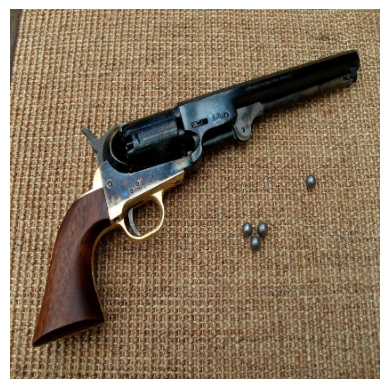



Threat Classification: Threat Level: 3



Reasoning: Reasoning:
Okay, so I'm trying to figure out the military threat level based on this scenario provided. Let me break it down step by step.

First, looking at the scene type: it's a battlefield. That already gives me some indication that there's an active combat or preparation context. The personnel are wearing Union uniforms with shoulder straps indicating a captain's rank, and they have a revolver pistol as their sidearm. Revolvers were common in the American Civil War era, so this fits into that historical context.

The threat level is initially assessed at 3, which means increased significance, aggressive tone, battlefield setting, military preparation. But I need to determine if it's higher or lower based on additional details.

Detected equipment includes a revolver with wooden grip and brass accents, which is consistent with historical firearms used during the Civil War. There are three bullets next to the gun, suggesting the

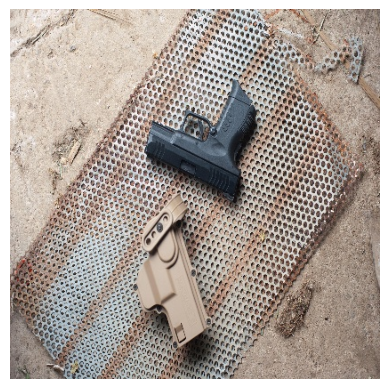



Threat Classification: Threat Level: 1



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on the given scenario. Let me start by reading through the provided text carefully.

The scene is described as a battlefield setting with personnel wearing standard combat uniforms and tactical gear like rifles, scopes, vests, and communication devices. The presence of visible rank insignia suggests a command structure, which usually implies some organization and control. The threat level is initially assessed as 3, but I need to determine the actual classification based on the scale provided.

Looking at the equipment profiling, there are handguns and tactical gear like holsters, but no protective equipment is visible. Simulation markers such as orange-tipped barrels or blank suppressors aren't present either. This makes me think it's not a simulation scenario because those markers usually indicate training exercises with reduced realism.

The environmental c

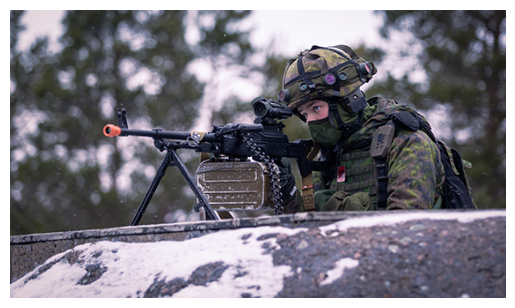



Threat Classification: Threat Level: 2



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on the given scenario. Let me start by reading through all the details carefully.

First, the scene is described as a battlefield setting. The individual is wearing a camouflage uniform without any visible insignia or rank, which makes me think it's a tactical unit rather than regular infantry. They have a machine gun slung over their shoulder, which suggests they're prepared for combat. The absence of markers and blank rounds in the simulation equipment profiling might mean this isn't just a training exercise but could be real.

The environmental context mentions snow on the ground and trees in the background. Snow can sometimes indicate a cold climate, but it's also possible that this is part of a realistic training scenario. However, without any clear markers or simulation indicators, I have to consider whether this is real combat or controlled training.

L

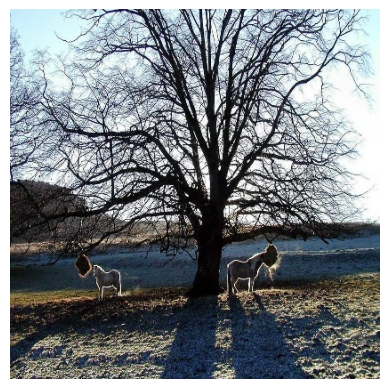



Threat Classification: Threat Level: 2



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on the given scenario. Let me start by reading through the provided text carefully.

The image depicts two horses in an open field under a tree. There's no visible military gear like uniforms or weapons. The horses look domesticated, not like they're used for combat. The threat level is initially assessed as 0 because there's nothing indicating active duty, patrolling, or exercises.

Looking at the analysis of military equipment, it says none are visible. So, no weapons or tactical gear. The environment seems peaceful, maybe a farm or nature reserve. No signs of simulation or real combat either.

Then, there's an assessment of aggression level at 2 because someone is aiming a firearm at an unseen target. They're in a defensive posture with the tree as cover, suggesting they might have recently engaged an adversary. The use of a firearm indicates some level of 

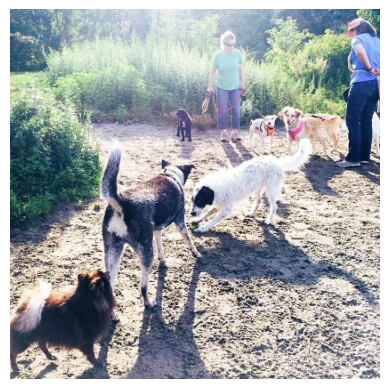



Threat Classification: Threat Level: 1



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on the given information. Let me start by reading through the assessment and conclusion provided.

The scene is described as a civilian setting with dogs and people in casual attire. There are no uniforms, insignia, or ranks visible. The individuals are dressed casually, which suggests it's not a military context. The equipment profiling shows no weapons or tactical gear, so that's a point against a high threat level.

Looking at the simulation vs. real combat section, there are no orange-tipped barrels or blank suppressors, which usually indicate training exercises. However, the environmental context mentions dogs and handlers in a park-like setting, which hints at a controlled training scenario. The aggression level is assessed as 2 because one person is holding a firearm with an orange tip, likely for training purposes.

The conclusion from the assessment s

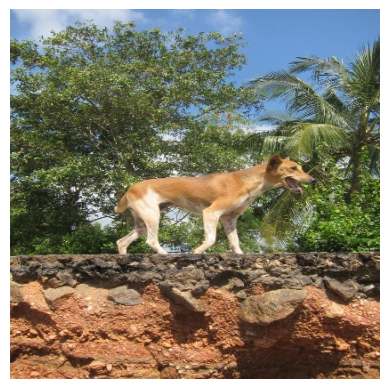



Threat Classification: Threat Level: 1



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on the given image description. Let me start by reading through the provided information carefully.

The scene is described as a dog standing on a rocky surface with trees in the background. The assessment mentions that it could be a training ground or a natural area used for military exercises, but without clear signs of military equipment or personnel, it's hard to classify it definitively as a "military context" scene. 

Personnel gear isn't visible either—no uniforms, insignia, or ranks. The subject is an animal, specifically a dog, which doesn't inherently pose a threat unless specified otherwise. So, the threat classification can't be accurately assigned based on this info.

Looking at the equipment profiling, there are no weapons, tactical gear, or protective equipment visible. Simulation markers like orange-tipped barrels or blank suppressors aren't pr

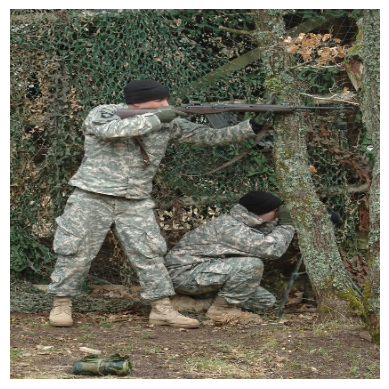



Threat Classification: Threat Level: 4



Reasoning: Reasoning:
Okay, so I need to figure out the military threat level based on the given scenario. Let me start by reading through all the details carefully.

The scene is set on a training ground. The personnel are wearing camouflage fatigues with digital patterns, which makes sense for a military setting. They have rifles with scopes and tactical gear like helmets and vests. That's definitely military equipment. 

The threat level is initially assessed as 2, but I need to determine the actual threat level using the scale provided. The scale goes from 0 to 4, where 4 is high threat with clear military aggression, attack formations, and possible casualties.

Looking at the detected equipment, there are rifles with scopes, tactical vests or backpacks, combat boots, gloves, and helmets. No orange-tipped barrels or blank suppressors are visible, which might indicate simulation markers. Also, there's no mention of battle simulation sensor

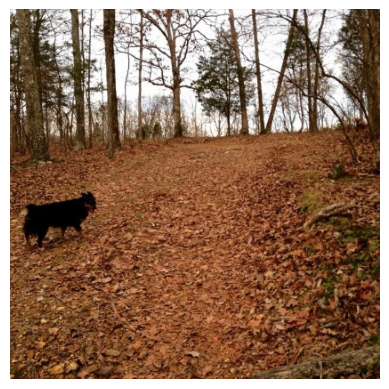



Threat Classification: Threat Level: 1



Reasoning: Reasoning:
Okay, so I'm trying to figure out the military threat level based on this image description. Let me break it down step by step.

First, the scene is described as a wooded area with fallen leaves and trees in the background. That makes me think it's either a training ground or a natural setting for some kind of operation. The presence of a dog is noted, which could indicate a search and rescue mission or a patrol. But there are no visible uniforms, insignia, or rank, so I can't immediately tell if it's military personnel.

The threat level is tricky because there's no clear indication of active threats like enemy forces or weapons. However, the dog being present might suggest a low-risk environment unless there are unseen dangers. The absence of other military gear or signs of combat points towards this possibly being a controlled training exercise rather than an actual combat situation.

Looking at the equipment profilin

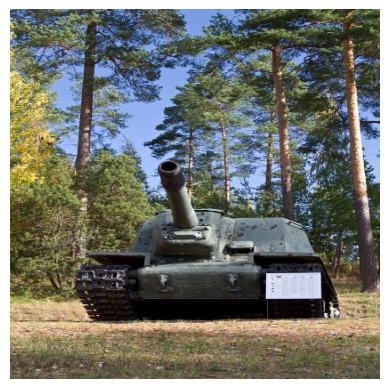



Threat Classification: Threat Level: 3



Reasoning: Reasoning:
Okay, so I'm trying to figure out the military threat level based on this scenario. Let me go through each part step by step.

First, the scene is described as a military base or training ground because there's a tank visible and it looks like a grassy area. So, that already gives me some context about where this image might be taken. It's not in a civilian setting; it's specifically on a military installation or during a training exercise.

Next, the personnel gear section mentions that if someone was operating the tank, they'd likely be wearing standard military attire. That includes helmets, vests, and possibly insignia. But there are no visible people in the image, so I can't see their exact gear, but knowing that military personnel would typically wear such gear gives me an idea of the environment.

The threat level is initially considered low to moderate because there's no immediate indication of a threat like enem

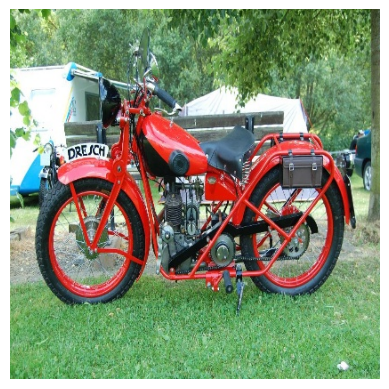



Threat Classification: Threat Level: 1



Reasoning: Reasoning:
Okay, so I'm trying to figure out the military threat level based on this image description. Let me go through it step by step.

First, the scene is described as a military base or training ground because there's a motorcycle and what looks like a tent in the background. That makes sense because military bases often have such setups for training exercises.

Next, the personnel gear section mentions that if someone was operating the motorcycle, they'd likely be wearing standard issue military attire. So, it's implying that this is part of a military setting, not a civilian one.

The threat level is initially considered low because there's no specific information about threats or hostile activities. But I need to look deeper into the equipment and context.

Looking at the detected equipment, there's a red motorcycle which seems vintage or custom, not standard issue. That makes me think it's for display rather than actual u

In [51]:
# Directory containing threat classification files
#threat_class_directory = '/Users/chetankothari/BDA_Master_Thesis_ThreatDetection_Data/Data/Threat_Class'

# Loop through each threat classification file in the directory
for threat_file in os.listdir(threat_class_directory):
    threat_class_path = os.path.join(threat_class_directory, threat_file)
    
    # Read the threat classification file
    with open(threat_class_path, "r") as file:
        content = file.read()
        
        # Check if the threat level is not 0
        if "Threat Level: 0" not in content:
            # Extract the base name of the file (without extension)
            base_name = os.path.splitext(threat_file)[0]
            
            # Construct the corresponding image and object file paths
            image_path = os.path.join(image_directory, f"{base_name}.jpg".replace("_threat_class", ""))
            objects_path = os.path.join(objects_directory, f"{base_name.replace('_threat_class', '')}_objects.txt")
            reason_path = os.path.join(reasoning_directory, f"{base_name.replace('_threat_class', '')}_threat_reasoning.txt")
            # Print the image and object file paths
            with open(objects_path, "rb") as obj_file:
                print(f"objects: {obj_file.read()}")
            print(f"Image:") 
            display_local_image(image_path)
            print("\n")
            print("Threat Classification:", content)
            print("\n")
            with open(reason_path, "r") as reason_file:
                print("Reasoning:", reason_file.read())
            print("\n")
            print("------------------------------------------------------------------------------------------------------------------")
            print("\n")

In [59]:
import pandas as pd
import os

# Initialize lists to store data
image_names = []
descriptions = []
objects_list = []
reasonings = []
threat_classes = []

# Loop through each image in the directory
for image_name in os.listdir(image_directory):
    base_name = os.path.splitext(image_name)[0]

    description_path = os.path.join(description_directory, f"{base_name}_description.txt")
    objects_path = os.path.join(objects_directory, f"{base_name}_objects.txt")
    threat_reasoning_path = os.path.join(reasoning_directory, f"{base_name}_threat_reasoning.txt")
    threat_class_path = os.path.join(threat_class_directory, f"{base_name}_threat_class.txt")

    # Read description
    if os.path.exists(description_path):
        with open(description_path, "r") as file:
            description = file.read()
    else:
        description = "N/A"

    # Read objects
    if os.path.exists(objects_path):
        with open(objects_path, "r") as file:
            objects = file.read()
    else:
        objects = "N/A"

    # Read reasoning
    if os.path.exists(threat_reasoning_path):
        with open(threat_reasoning_path, "r") as file:
            reasoning = file.read()
    else:
        reasoning = "N/A"

    # Read threat class
    if os.path.exists(threat_class_path):
        with open(threat_class_path, "r") as file:
            threat_class = file.read()
    else:
        threat_class = "N/A"

    # Append data to lists
    image_names.append(image_name)
    descriptions.append(description)
    objects_list.append(objects)
    reasonings.append(reasoning)
    threat_classes.append(threat_class)

# Create a DataFrame
data = {
    "Image Name": image_names,
    "Description": descriptions,
    "Objects": objects_list,
    "Reasoning": reasonings,
    "Threat Class": threat_classes
}
df = pd.DataFrame(data)

# Ensure the output directory exists
output_directory = "/Users/chetankothari/VS Projects/BDA_Master_Thesis_ThreatDetection_Data/Data/Output"
os.makedirs(output_directory, exist_ok=True)

# Save DataFrame to Excel
output_path = os.path.join(output_directory, "threat_analysis.xlsx")
df.to_excel(output_path, index=False)

print(f"Excel sheet created at {output_path}")


Excel sheet created at /Users/chetankothari/VS Projects/BDA_Master_Thesis_ThreatDetection_Data/Data/Output/threat_analysis.xlsx


In [60]:
import os
import shutil
import zipfile
# Now we will zip the directories and empty them
# Directories to be zipped
directories_to_zip = [
    description_directory,
    reasoning_directory,
    threat_class_directory,
    objects_directory,
]

# Output zip file path
zip_file_path = os.path.join(base_dir, "Data/Output/threat_analysis.zip")

# Create a zip file
with zipfile.ZipFile(zip_file_path, 'w') as zipf:
    for directory in directories_to_zip:
        for foldername, subfolders, filenames in os.walk(directory):
            for filename in filenames:
                file_path = os.path.join(foldername, filename)
                arcname = os.path.relpath(file_path, base_dir)
                zipf.write(file_path, arcname)

print(f"Zip file created at {zip_file_path}")

# Empty the directories
for directory in directories_to_zip:
    for filename in os.listdir(directory):
        file_path = os.path.join(directory, filename)
        try:
            if os.path.isfile(file_path) or os.path.islink(file_path):
                os.unlink(file_path)
            elif os.path.isdir(file_path):
                shutil.rmtree(file_path)
        except Exception as e:
            print(f"Failed to delete {file_path}. Reason: {e}")

print("Directories emptied.")


Zip file created at /Users/chetankothari/VS Projects/BDA_Master_Thesis_ThreatDetection_Data/Data/Output/threat_analysis.zip
Directories emptied.


In [61]:


# Define the zip file path
zip_file_path = os.path.join(output_directory, "threat_detection_images_set1.zip")

# Create a zip file
with zipfile.ZipFile(zip_file_path, 'w') as zipf:
    for image_name in image_names:
        image_path = os.path.join(image_directory, image_name)
        if os.path.isfile(image_path):
            zipf.write(image_path, os.path.basename(image_path))

print(f"Zip file created at {zip_file_path}")

# Empty the images directory
for image_name in image_names:
    image_path = os.path.join(image_directory, image_name)
    try:
        if os.path.isfile(image_path):
            os.unlink(image_path)
    except Exception as e:
        print(f"Failed to delete {image_path}. Reason: {e}")

print("Images directory emptied.")

Zip file created at /Users/chetankothari/VS Projects/BDA_Master_Thesis_ThreatDetection_Data/Data/Output/threat_detection_images_set1.zip
Images directory emptied.
